---
title: "Visualize strain level OGG variation within species"

author: "Benjamin Doran"

date: today

---

## Setup

In [1]:
using DrWatson
@quickactivate "Doran_etal_2022"

using SPI, MLJ
using MLJBase: train_test_pairs
using Clustering, Distances
using Muon, CSV, DataFrames
using StatsPlots, StatsBase
using NewickTree, NewickTreeTools
using Gotree_jll

using CategoricalArrays: cut, recode!
using Distances
using NearestNeighbors
using LaTeXStrings
using FreqTables

using HypothesisTests
using MultipleTesting

function getlims(x, y) 
    lims = extrema(vcat(x, y))
    lims =  lims .+ (-(lims[2] - lims[1]) * 0.1, (lims[2] - lims[1]) * 0.1)
end

Base.@kwdef struct GroupedEuclidean{T} <: Metric
    groups::Vector{T}
end
function (dist::GroupedEuclidean)(r, a, b)
    for grp in dist.groups
        r += sqrt(sum(abs2.(a[grp] .- b[grp])))
    end
    r
end
function (dist::GroupedEuclidean)(a, b)
    r = zero(eltype(a))
    dist(r, a, b)
end
function (dist::GroupedEuclidean)(a::Number, b::Number)
    euclidean(a, b)
end
groupedeuclidean(a, b, intervals=collect(axes(a,1))) = GroupedEuclidean(intervals)(a, b)
groupedeuclidean!(r, a, b, intervals=collect(axes(a,1))) = GroupedEuclidean(intervals)(r, a, b)

groupedeuclidean! (generic function with 2 methods)

In [2]:
ddir = datadir("exp_pro", "BB728")
rdir = projectdir("_research", "donor_strainlevel_variation") |> mkpath
pdir = plotsdir("donor_strainlevel_variation") |> mkpath
biobank = readh5mu(joinpath(ddir, "BB728.h5mu"))

┌ Warning: Cannot join columns with the same name because var_names are intersecting.
└ @ Muon /Users/ben/.julia/packages/Muon/eLqpV/src/mudata.jl:351


MuData object 728 ✕ 21485
└ metabolites_foldchange
  AnnData object 728 ✕ 50
└ metabolites_millimolar
  AnnData object 728 ✕ 10
└ UPorder_oggs
  AnnData object 728 ✕ 10177
└ oggs
  AnnData object 728 ✕ 11248

In [3]:
trn_mask = biobank.obs.inBB673 .== 1
tst_mask = biobank.obs.inBB673 .== 0
trn_mtx = biobank["UPorder_oggs"].X[:,:][trn_mask, :]
tst_mtx = biobank["UPorder_oggs"].X[:,:][tst_mask, :];
mtx = biobank["UPorder_oggs"].X[:,:];

In [4]:
bbusv = SVD(
    biobank["UPorder_oggs"].obsm["inferredLSVs"][:,:],
    biobank["UPorder_oggs"].uns["UP_SVs"][:],
    biobank["UPorder_oggs"].varm["UP_RSVs"][:, :]',
    );
norm(mtx .- projectout(bbusv)) / norm(mtx)

0.03065109952898508

In [5]:
sigresdf = CSV.read(joinpath(ddir, "significant_metabolites_in_subsetSPItree_numisolatesperspecies=+20.csv"), DataFrame)

earlytreesigmetabolitesdf = filter(:node_depth_maxeffect => >(3.5), sigresdf) |>
    df -> groupby(df, :metabolite_name) |>
    df -> DataFrames.combine(df, :effect_size_abs => maximum) |>
    df -> sort(df, :effect_size_abs_maximum, rev=true)
middletreesigmetabolitesdf = filter(:node_depth_maxeffect => (x)-> 2 .< x .< 3.5, sigresdf) |>
    df -> groupby(df, :metabolite_name) |>
    df -> DataFrames.combine(df, :effect_size_abs => maximum) |>
    df -> sort(df, :effect_size_abs_maximum, rev=true)
latetreesigmetabolitesdf = filter(:node_depth_maxeffect => <(2), sigresdf) |>
    df -> groupby(df, :metabolite_name) |>
    df -> DataFrames.combine(df, :effect_size_abs => maximum) |>
    df -> sort(df, :effect_size_abs_maximum, rev=true);

metabolite_has_effectsize_mask = vcat(
    earlytreesigmetabolitesdf,
    middletreesigmetabolitesdf,
    latetreesigmetabolitesdf,
).effect_size_abs_maximum .> 0.6;

orderedmetabolites_names = vcat(
    earlytreesigmetabolitesdf.metabolite_name,
    middletreesigmetabolitesdf.metabolite_name,
    latetreesigmetabolitesdf.metabolite_name,
);
metabolite_mask_ord_early = indexin(earlytreesigmetabolitesdf.metabolite_name, replace.(biobank["metabolites_foldchange"].var_names, "_rel"=>""));
metabolite_mask_ord_middle = indexin(middletreesigmetabolitesdf.metabolite_name, replace.(biobank["metabolites_foldchange"].var_names, "_rel"=>""));
metabolite_mask_ord_late = indexin(latetreesigmetabolitesdf.metabolite_name, replace.(biobank["metabolites_foldchange"].var_names, "_rel"=>""));
metabolite_mask_ord = indexin(orderedmetabolites_names, replace.(biobank["metabolites_foldchange"].var_names, "_rel"=>""));

In [6]:
bb_met_lfc = biobank["metabolites_foldchange"].X[:, :];
bb_met_lfc[isinf.(bb_met_lfc)] .= 0.0;
metabolicdistance = pairwise(Euclidean(), bb_met_lfc; dims=1);

In [7]:
metabolicallyvariabledf = biobank.obs[trn_mask, :] |>
    df->DataFrames.transform(df, eachindex => :rowid) |>
    df->groupby(df, :species) |>
    df->DataFrames.combine(df, 
        nrow => :num_isolates, 
        :rowid => ((x)->maximum(metabolicdistance[x,x])) => :max_metabolicdistance,
        :rowid => ((x)->maximum(metabolicdistance[x,x]) > 20) => :isvariable,
        ) |>
    df->filter(:num_isolates => >=(10), df) |>
    df->sort(df, [:max_metabolicdistance, :num_isolates], rev=true)

specieswith20reps = metabolicallyvariabledf |>
    df -> filter(:num_isolates => >=(20), df) |>
    df -> filter(:species => !=("unclassified"), df) |>
    df -> sort(df, :num_isolates, rev=true)


# spe20rep_mask = .!isnothing.(indexin(bbobs_trn.species, specieswith20reps.species));
spe20rep_mask = .!isnothing.(indexin(biobank.obs.species[trn_mask], specieswith20reps.species));

In [8]:
full_train_mask = zeros(Bool, 728)
full_train_mask[trn_mask] .= spe20rep_mask;

full_test_mask = ones(Bool, 728)
full_test_mask[trn_mask] = .!spe20rep_mask
sum(full_train_mask), sum(full_test_mask)

(356, 372)

In [9]:
bbmtx = biobank["oggs"].X[:, :]
bbmtx_trn = bbmtx[full_train_mask, :]
bbmtx_tst = bbmtx[full_test_mask, :]
# filter out oggs that are constant
ogg_mask = vec(mapslices(c->std(c) > 0, bbmtx_trn, dims=1))
bbmtx_trn = bbmtx_trn[:, ogg_mask]
bbmtx_tst = bbmtx_tst[:, ogg_mask]
zbbmtx_trn = mapslices(StatsBase.zscore, bbmtx_trn, dims=1)
zbbmtx_tst = mapslices(StatsBase.zscore, bbmtx_tst, dims=1)
replace!(zbbmtx_tst, NaN=>0.) # replace zscored NaNs with zeros (it's what they were before)
bbusv_internal = svd(zbbmtx_trn)
BBUinternal_tst = projectinLSV(zbbmtx_tst, bbusv_internal)
BBpcs_trn = bbusv_internal.U * diagm(bbusv_internal.S)
BBpcs_tst = BBUinternal_tst * diagm(bbusv_internal.S);

In [10]:
bboggnames = biobank["oggs"].var_names[ogg_mask];

In [11]:
biobank.obs[!, "species_donor"] = biobank.obs.species .* "_" .* biobank.obs.donor
bbobs_trn = biobank.obs[full_train_mask, :]
bbobs_tst = biobank.obs[full_test_mask, :];

In [12]:
subsetDij = biobank["UPorder_oggs"].obsp["SDij"][full_train_mask, full_train_mask];
subsettree_hc = hclust(subsetDij, linkage=:average, branchorder=:optimal)
subsettreestring = SPI.nwstr(subsettree_hc, bbobs_trn.ID; labelinternalnodes=false)
subsettree = readnw(subsettreestring);

In [13]:
trnX = mtx[full_train_mask, :]
trnYdf = bbobs_trn;

metab_trnY = bb_met_lfc[full_train_mask, metabolite_mask_ord];
metab_tstY = bb_met_lfc[full_test_mask, metabolite_mask_ord];

measurable_metabolites_mask = mapslices(c->mean(c .==0.) < .9, metab_trnY, dims=1)|>vec;
keepmetabolites_mask = measurable_metabolites_mask .& metabolite_has_effectsize_mask

PCs_trnX = DataFrame(BBpcs_trn[:, 1:10], :auto);
PCs_tstX = DataFrame(BBpcs_tst[:, 1:10], :auto);

In [14]:
specieslabels = [
    "Bacteroides uniformis",
    "Phocaeicola vulgatus",
    "Bacteroides thetaiotaomicron",
    "[Ruminococcus] gnavus",
    "Bifidobacterium breve",
    "[Eubacterium] rectale",
    "Dorea formicigenerans",
    "Coprococcus comes",
    "Blautia luti & Blautia wexlerae",
    "Anaerostipes hadrus",
]
shapes = permutedims([:circle, :rect, :star5, :diamond, :hexagon, :ltriangle, :pentagon, :utriangle, :dtriangle, :rtriangle, :star4])
speciescolors = wload(joinpath(ddir, "subsettreecolors.jld2"))["colors"]
speciescolors_ordered = permutedims(speciescolors[replace(indexin(sort(unique(trnYdf.species)), specieslabels), nothing=>9)])

In [15]:
filter(n->id(n) == 483, prewalk(subsettree))[1]

((DFI.1.210:0.007850086,DFI.1.180:0.007850086):0.001335135,(DFI.1.224:0.003935376,DFI.1.155:0.003935376):0.005249845):0.07300825;

In [16]:
tree = subsettree
numnodestested = 0
for node in prewalk(tree)
    #  if group size would be less than 1 skip node
    (isleaf(node) || any(isleaf.(node.children))) && continue
    numnodestested += 1
end
numnodestested

96

In [17]:
size(bbmtx_trn, 2)

5449

In [18]:
96 * 5449

523104

## Start comparing OGGs

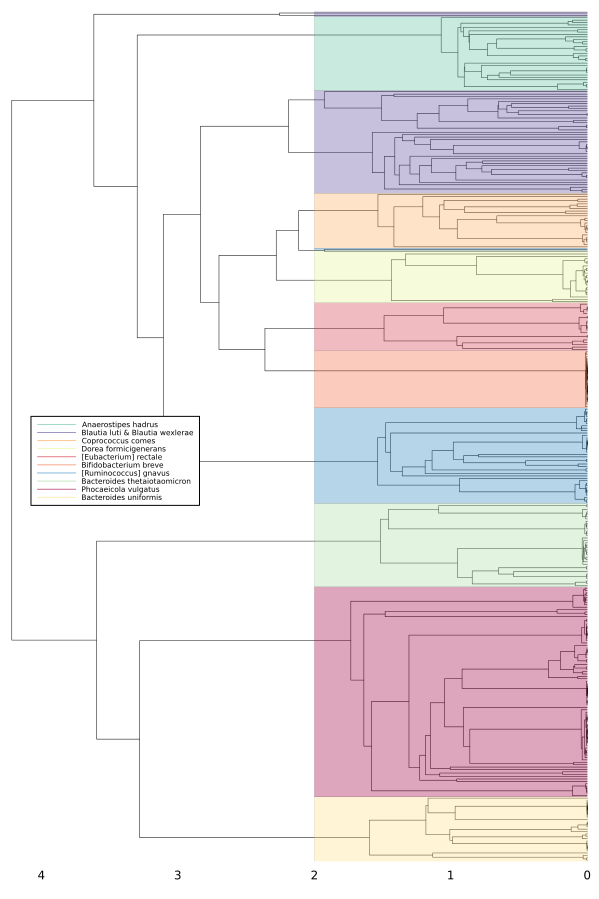

In [19]:
# speciescolors = shuffle(permutedims(palette(:Spectral_10, 10).speciescolors.colors))
rectangle(w, h, x, y) = Shape(x .+ [0,w,w,0], y .+ [0,0,h,h])
speciesvector = bbobs_trn.species[subsettree_hc.order]
length(unique(speciesvector))

breaks = findall(speciesvector[begin:(end-1)] .!= speciesvector[2:end])[Not([10, 11, 12, 13, 14,15])]
edges = [(s, e) for (s,e) in zip(vcat([0],breaks), vcat(breaks, [length(speciesvector)]))];
rects = [rectangle(2,(e-s),0,s+.5) for (s,e) in zip(vcat([0],breaks), vcat(breaks, [length(speciesvector)]))];

plot(subsettree_hc, 
    size=(600, 900),
    lw=.5,
    yflip=true, 
    xmirror=true,
    xticks=:none,
    permute=(:y, :x),
    grid=false,
    tickdirection=:none,
    rightmargin=1Plots.Measures.mm, 
    label="",
    framestyle=:grid,
)
plot!(permutedims(rects[Not(8, 12)]), fill=0.35, lw=0, c=speciescolors, label="")
plot!(rects[8], fill=0.35, lw=0, c=speciescolors[4], label="")
plot!(rects[12], fill=0.35, lw=0, c=speciescolors[9], label="")
specieslabels= [
    "Bacteroides uniformis",
    "Phocaeicola vulgatus",
    "Bacteroides thetaiotaomicron",
    "[Ruminococcus] gnavus",
    "Bifidobacterium breve",
    "[Eubacterium] rectale",
    "Dorea formicigenerans",
    "Coprococcus comes",
    "Blautia luti & Blautia wexlerae",
    "Anaerostipes hadrus",
]
fancy_treeplot = plot!(zeros(1, 10), 
    legend=:left,
    labels=permutedims(reverse(specieslabels)), 
    c=reverse(speciescolors),
    legendfontsize=5,
)


In [20]:
speciesname = "rectale"

"rectale"

In [23]:
speciesparent_leafnames

20-element Vector{String}:
 "MSK.9.15"
 "MSK.9.13"
 "MSK.13.50"
 "MSK.13.48"
 "MSK.13.59"
 "MSK.16.22"
 "MSK.16.45"
 "MSK.17.57"
 "MSK.17.19"
 "MSK.17.3"
 "MSK.17.79"
 "MSK.17.42"
 "MSK.17.13"
 "MSK.17.78"
 "MSK.17.70"
 "MSK.22.23"
 "MSK.22.28"
 "MSK.22.51"
 "MSK.22.19"
 "MSK.22.92"

In [21]:
## Get species tree
subsettree = readnw(SPI.nwstr(subsettree_hc, trnYdf.ID; labelinternalnodes=false));
leaves = getleaves(subsettree)
leafnames = name.(leaves);

treeorder = indexin(leafnames, trnYdf.ID);
isspecies = contains.(trnYdf.species[treeorder], speciesname);

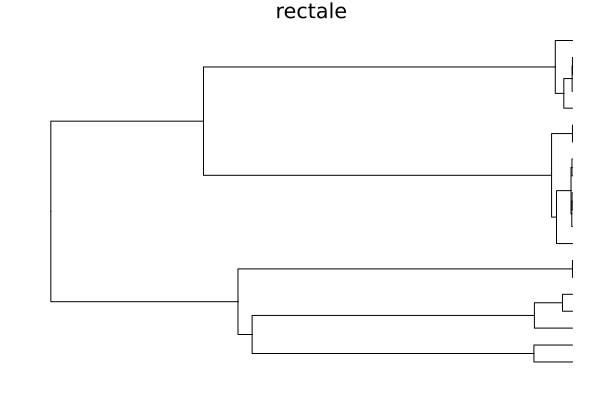

In [22]:
speciesparent = NewickTree.extract(subsettree, leafnames[isspecies]) |>
    NewickTree.nwstr |>
    readnw

speciesparent_leafnames = getleafnames(speciesparent)

# remove names of leaves for plotting
map(prewalk(speciesparent)) do node
    NewickTree.setname!(node, "")
end;

speciestreeplot = plot(speciesparent, fs = 4, title="$speciesname")

In [34]:
mtxIDs = trnYdf.ID[contains.(trnYdf.species, speciesname)]
species_oggcounts = bbmtx_trn[contains.(trnYdf.species, speciesname), :][indexin(mtxIDs, speciesparent_leafnames), :]

27×5449 Matrix{Int64}:
 0  0  0  0  0  0  1  1  0  0  0  0  0  …  0  0  0  0  0  1  1  0  0  0  0  0
 0  0  0  0  0  0  1  0  0  0  0  0  0     0  0  0  0  0  0  1  0  0  0  0  0
 0  0  0  0  0  0  1  1  0  0  0  0  0     0  0  0  0  0  1  1  0  0  0  0  0
 0  0  0  0  0  0  1  1  0  0  0  0  0     0  0  1  0  0  0  1  0  0  0  0  0
 0  0  0  0  0  0  1  0  0  0  0  0  0     0  0  1  0  0  0  1  0  0  0  0  0
 0  0  0  0  0  0  1  1  0  0  0  0  0  …  0  0  0  0  0  1  1  0  0  0  0  0
 0  0  0  0  0  0  1  1  0  0  0  0  0     0  0  0  0  0  1  1  0  0  0  0  0
 0  0  0  0  0  0  1  0  0  0  0  0  0     0  0  0  0  0  0  1  0  0  0  0  0
 0  0  0  0  0  0  1  0  0  0  0  0  0     0  0  0  0  0  0  1  0  0  0  0  0
 0  0  0  0  0  0  1  1  0  0  0  0  0     0  0  0  0  0  1  1  0  0  0  0  0
 ⋮              ⋮              ⋮        ⋱           ⋮              ⋮        
 0  0  0  0  0  0  1  0  0  0  0  0  0     0  0  0  0  0  0  1  0  0  0  0  0
 0  0  0  0  0  0  1  1  0  0  0  0  0    

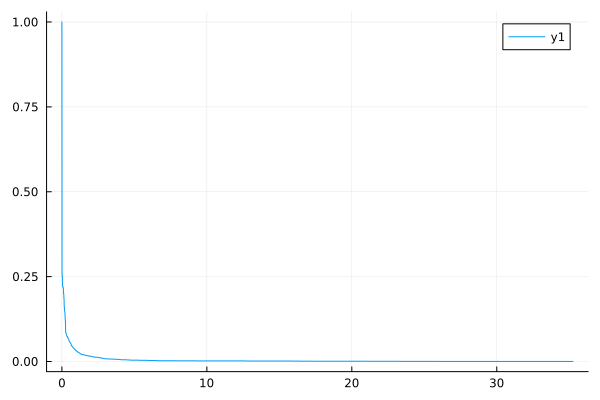

In [35]:
species_ogg_var = vec(var(species_oggcounts, dims=1))
prop_var = map(0:.01:maximum(species_ogg_var)) do t; sp=species_ogg_var
    mean(sp .>= t)
end
plot(0:.01:maximum(species_ogg_var), prop_var)

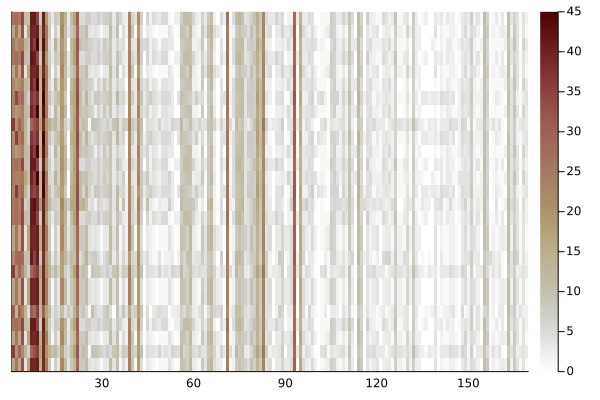

In [36]:
hmapplot = heatmap(
    species_oggcounts[:, partialsortperm(species_ogg_var, 1:169, rev=true)],
    c=:bilbao, 
    yticks=false,
    grid=false,
    
)

In [37]:
using HypothesisTests
using MultipleTesting

In [45]:
speciesparent_with_names = NewickTree.extract(subsettree, leafnames[isspecies])
isolate_ids = getleafnames(speciesparent_with_names)
testresults = DataFrame()
for node in prewalk(speciesparent_with_names)
    (isleaf(node) || any(isleaf.(node.children))) && continue
    grp1_idx = indexin(getleafnames(node.children[1]), isolate_ids)
    grp2_idx = indexin(getleafnames(node.children[2]), isolate_ids)
    pvals = mapslices(species_oggcounts, dims=1) do column
        pvalue(MannWhitneyUTest(column[grp1_idx], column[grp2_idx]))
    end |> vec
    effects = mapslices(species_oggcounts, dims=1) do column
        abs(mean(column[grp1_idx]) - mean(column[grp2_idx]) / std(column))
    end |> vec
    node_ids = [id(node), NewickTree.height(node)]

    testresults = vcat(testresults, 
        DataFrame(
            :nodeids => id(node),
            :nodeheight =>  NewickTree.height(node),
            :ogg_name => bboggnames,
            :ogg_idx => collect(axes(species_oggcounts, 2)),
            :effectsize => effects,
            :pvals => pvals
        )
    )
end
testresults[!, "pval_BH"] .= adjust(testresults.pvals, BenjaminiHochberg());
testresults[!, "pval_Bon"] .= adjust(testresults.pvals, Bonferroni());
testresults

Row,nodeids,nodeheight,ogg_name,ogg_idx,effectsize,pvals,pval_BH,pval_Bon
,UInt16,Float64,String,Int64,Float64,Float64,Float64,Float64
1,4,0.936555,32EMM,1,NaN,1.0,1.0,1.0
2,4,0.936555,331MM,2,NaN,1.0,1.0,1.0
3,4,0.936555,337MM,3,NaN,1.0,1.0,1.0
4,4,0.936555,2Z7HP,4,NaN,1.0,1.0,1.0
5,4,0.936555,2Z7HS,5,NaN,1.0,1.0,1.0
6,4,0.936555,2Z7HZ,6,NaN,1.0,1.0,1.0
7,4,0.936555,2Z7I5,7,Inf,1.0,1.0,1.0
8,4,0.936555,2Z7ID,8,0.744992,0.863063,1.0,1.0
9,4,0.936555,2Z7IJ,9,NaN,1.0,1.0,1.0


In [47]:
function cliffs_d(a, b) 
    ans = 0.
    for i in a, j in b
        ans += sign(i - j)
    end
    ans / (length(a) * length(b))
end

function log2FC(a, b) 
    mean(log2.(a .+ 1)) - mean(log2.(b .+ 1))
end

log2FC (generic function with 1 method)

In [48]:
# significance tests across full subset tree
tree = subsettree

maxtreeheight = last(maximum(getheights(tree)))

leaves = getleaves(tree)
leafnames = name.(leaves);
treeorder = indexin(leafnames, trnYdf.ID);

ogg_mtx = bbmtx_trn[treeorder, :]
taxon_info = trnYdf[treeorder, :]

ogg_freqs = vec(mean(ogg_mtx .> 0, dims=1))

isolate_ids = getleafnames(tree)
testresults = DataFrame()

for node in prewalk(tree)
    #  if group size would be less than 1 skip node
    (isleaf(node) || any(isleaf.(node.children))) && continue
    
    # find comparison groups
    grp1_idx = indexin(getleafnames(node.children[1]), isolate_ids)
    grp2_idx = indexin(getleafnames(node.children[2]), isolate_ids)
    
    pvals = mapslices(ogg_mtx, dims=1) do column
        pvalue(MannWhitneyUTest(column[grp1_idx], column[grp2_idx]))
    end |> vec
    
    # make null
    null_qs = map(1:100) do i
        n = length(grp1_idx)
        m = length(grp2_idx)
        perm_idx = shuffle(vcat(grp1_idx, grp2_idx))
        qs = mapslices(ogg_mtx, dims=1) do column_perm
            q = pvalue(MannWhitneyUTest(column_perm[perm_idx[1:n]], column_perm[perm_idx[n+1:end]]))
        end
        minimum(qs)
    end

    qvals = mapslices(ogg_mtx, dims=1) do column
        pval = pvalue(MannWhitneyUTest(column[grp1_idx], column[grp2_idx]))
        mean(null_qs .< pval)
    end |> vec
    
    effects = mapslices(ogg_mtx, dims=1) do column
        abs(mean(column[grp1_idx]) - mean(column[grp2_idx]) / std(column))
    end |> vec

    log_effects = mapslices(ogg_mtx, dims=1) do column
        logcol = log2.(column.+1)
        abs(mean(logcol[grp1_idx]) - mean(logcol[grp2_idx]) / std(logcol))
    end |> vec
    
    log2FCs = mapslices(ogg_mtx, dims=1) do column
        log2FC(column[grp1_idx], column[grp2_idx])
    end |> vec

    cliffs_ds = mapslices(ogg_mtx, dims=1) do column
        cliffs_d(column[grp1_idx], column[grp2_idx])
    end |> vec

    grp1_prp_exp = mapslices(ogg_mtx, dims=1) do column
        mean(column[grp1_idx] .> 0)
    end |> vec

    grp2_prp_exp = mapslices(ogg_mtx, dims=1) do column
        mean(column[grp2_idx] .> 0)
    end |> vec
    
    testresults = vcat(testresults, 
        DataFrame(
            :nodeids => id(node),
            :nodeheight =>  NewickTree.height(node),
            :nodedepth =>  maxtreeheight - NewickTree.height(node),
            :grp1_N => length(grp1_idx),
            :grp2_N => length(grp2_idx),
            :grp1_phylum_mode => mode(taxon_info.phylum[grp1_idx]),
            :grp2_phylum_mode => mode(taxon_info.phylum[grp2_idx]),
            :grp1_species_mode => mode(taxon_info.species[grp1_idx]),
            :grp2_species_mode => mode(taxon_info.species[grp2_idx]),
            :grp1_species_donor_mode => mode(taxon_info.species_donor[grp1_idx]),
            :grp2_species_donor_mode => mode(taxon_info.species_donor[grp2_idx]),
            :ogg_name => bboggnames,
            :ogg_idx => collect(axes(species_oggcounts, 2)),
            :ogg_freqs => ogg_freqs,
            :grp1_prp_exp => grp1_prp_exp,
            :grp2_prp_exp => grp2_prp_exp,
            :effectsize => effects,
            :logeffectsize => log_effects,
            :log2FC => log2FCs,
            :cliffs_d => cliffs_ds,
            :pvals => pvals,
            :qvals => qvals,
        )
    )
end
testresults[!, "pval_BH"] .= adjust(testresults.pvals, BenjaminiHochberg());
testresults[!, "pval_Bon"] .= adjust(testresults.pvals, Bonferroni());
testresults[!, "qval_BH"] .= adjust(testresults.qvals, BenjaminiHochberg());
# DataFrames.transform!(testresults,
#     :nodedepth => (x-> x.>(4)) => :phylumlevel,
#     :nodedepth => (x-> 2 .< x .< 4) => :specieslevel,
#     :nodedepth => (x-> x .<(2)) => :strainlevel,
# )

tree_discretization = cut(testresults.nodedepth, [0, 2, 4, 5])
recode!(tree_discretization, 
    "[4, 5)"=>"phylum level", 
    "[2, 4)"=>"species level",
    "[0, 2)"=>"strain level")
testresults[!, "tree_level"] = tree_discretization
testresults;

In [513]:
CSV.write(joinpath(rdir, "full_ogg_wilcoxon_testresults_on_big10species.csv"), testresults)

"/Users/ben/projects/Doran_etal_2022/_research/donor_strainlevel_variation/full_ogg_wilcoxon_testresults_on_big10species.csv"

In [514]:
testresults |>
    df->filter(:pval_BH => <(0.05), df) |>
    df->CSV.write(joinpath(rdir, "significant_BH_ogg_wilcoxon_testresults_on_big10species.csv"), df)# df->filter(:effectsize => isfinite, df)

"/Users/ben/projects/Doran_etal_2022/_research/donor_strainlevel_variation/significant_BH_ogg_wilcoxon_testresults_on_big10species.csv"

In [515]:
testresults |>
    df->filter(:pval_Bon => <(0.05), df) |>
    df->CSV.write(joinpath(rdir, "significant_Bon_ogg_wilcoxon_testresults_on_big10species.csv"), df)# df->filter(:effectsize => isfinite, df)

"/Users/ben/projects/Doran_etal_2022/_research/donor_strainlevel_variation/significant_Bon_ogg_wilcoxon_testresults_on_big10species.csv"

In [833]:
testresults |>
    df->filter(:qval_BH => <(0.05), df) |>
    df->CSV.write(joinpath(rdir, "significant_Qbh_ogg_wilcoxon_testresults_on_big10species.csv"), df)# df->filter(:effectsize => isfinite, df)

"/Users/ben/projects/Doran_etal_2022/_research/donor_strainlevel_variation/significant_Qbh_ogg_wilcoxon_testresults_on_big10species.csv"

In [49]:
# significance tests across full subset tree
tree = subsettree

maxtreeheight = last(maximum(getheights(tree)))

leaves = getleaves(tree)
leafnames = name.(leaves);
treeorder = indexin(leafnames, trnYdf.ID);

metabolite_mtx = metab_trnY[treeorder, :]
taxon_info = trnYdf[treeorder, :]

metabolite_freqs = vec(mean(metabolite_mtx .> 0, dims=1))

isolate_ids = getleafnames(tree)
metab_testresults = DataFrame()

for node in prewalk(tree)
    #  if group size would be less than 1 skip node
    (isleaf(node) || any(isleaf.(node.children))) && continue
    
    # find comparison groups
    grp1_idx = indexin(getleafnames(node.children[1]), isolate_ids)
    grp2_idx = indexin(getleafnames(node.children[2]), isolate_ids)
    
    pvals = mapslices(metabolite_mtx, dims=1) do column
        pvalue(MannWhitneyUTest(column[grp1_idx], column[grp2_idx]))
    end |> vec
    
    # make null
    null_qs = map(1:100) do i
        n = length(grp1_idx)
        m = length(grp2_idx)
        perm_idx = shuffle(vcat(grp1_idx, grp2_idx))
        qs = mapslices(metabolite_mtx, dims=1) do column_perm
            q = pvalue(MannWhitneyUTest(column_perm[perm_idx[1:n]], column_perm[perm_idx[n+1:end]]))
        end
        minimum(qs)
    end

    qvals = mapslices(metabolite_mtx, dims=1) do column
        pval = pvalue(MannWhitneyUTest(column[grp1_idx], column[grp2_idx]))
        mean(null_qs .< pval)
    end |> vec
    
    effects = mapslices(metabolite_mtx, dims=1) do column
        abs(mean(column[grp1_idx]) - mean(column[grp2_idx]) / std(column))
    end |> vec

    log_effects = mapslices(metabolite_mtx, dims=1) do column
        # metabolites were already log2 transformed
        abs(mean(column[grp1_idx]) - mean(column[grp2_idx]) / std(column))
    end |> vec
    
    log2FCs = mapslices(metabolite_mtx, dims=1) do column
        # metabolites were already log2 transformed
        mean(column[grp1_idx]) - mean(column[grp2_idx])
    end |> vec

    cliffs_ds = mapslices(metabolite_mtx, dims=1) do column
        cliffs_d(column[grp1_idx], column[grp2_idx])
    end |> vec

    grp1_prp_exp = mapslices(metabolite_mtx, dims=1) do column
        mean(column[grp1_idx] .> 0)
    end |> vec

    grp2_prp_exp = mapslices(metabolite_mtx, dims=1) do column
        mean(column[grp2_idx] .> 0)
    end |> vec
    
    metab_testresults = vcat(metab_testresults, 
        DataFrame(
            :nodeids => id(node),
            :nodeheight =>  NewickTree.height(node),
            :nodedepth =>  maxtreeheight - NewickTree.height(node),
            :grp1_N => length(grp1_idx),
            :grp2_N => length(grp2_idx),
            :grp1_phylum_mode => mode(taxon_info.phylum[grp1_idx]),
            :grp2_phylum_mode => mode(taxon_info.phylum[grp2_idx]),
            :grp1_species_mode => mode(taxon_info.species[grp1_idx]),
            :grp2_species_mode => mode(taxon_info.species[grp2_idx]),
            :grp1_species_donor_mode => mode(taxon_info.species_donor[grp1_idx]),
            :grp2_species_donor_mode => mode(taxon_info.species_donor[grp2_idx]),
            :metabolite_name => orderedmetabolites_names,
            :metabolite_idx => metabolite_mask_ord,
            :metabolite_freqs => metabolite_freqs,
            :grp1_prp_exp => grp1_prp_exp,
            :grp2_prp_exp => grp2_prp_exp,
            :effectsize => effects,
            :logeffectsize => log_effects,
            :log2FC => log2FCs,
            :cliffs_d => cliffs_ds,
            :pvals => pvals,
            :qvals => qvals,
        )
    )
end
metab_testresults[!, "pval_BH"] .= adjust(metab_testresults.pvals, BenjaminiHochberg());
metab_testresults[!, "pval_Bon"] .= adjust(metab_testresults.pvals, Bonferroni());
metab_testresults[!, "qval_BH"] .= adjust(metab_testresults.qvals, BenjaminiHochberg());
# DataFrames.transform!(metab_testresults,
#     :nodedepth => (x-> x.>(4)) => :phylumlevel,
#     :nodedepth => (x-> 2 .< x .< 4) => :specieslevel,
#     :nodedepth => (x-> x .<(2)) => :strainlevel,
# )

tree_discretization = cut(metab_testresults.nodedepth, [0, 2, 4, 5])
recode!(tree_discretization, 
    "[4, 5)"=>"phylum level", 
    "[2, 4)"=>"species level",
    "[0, 2)"=>"strain level")
metab_testresults[!, "tree_level"] = tree_discretization
metab_testresults;

In [828]:
CSV.write(joinpath(rdir, "full_metabolite_wilcoxon_testresults_on_big10species.csv"), metab_testresults)

"/Users/ben/projects/Doran_etal_2022/_research/donor_strainlevel_variation/full_metabolite_wilcoxon_testresults_on_big10species.csv"

In [829]:
metab_testresults |>
    df->filter(:pval_BH => <(0.05), df) |>
    df->CSV.write(joinpath(rdir, "significant_BH_metabolite_wilcoxon_testresults_on_big10species.csv"), df)# df->filter(:effectsize => isfinite, df)

"/Users/ben/projects/Doran_etal_2022/_research/donor_strainlevel_variation/significant_BH_metabolite_wilcoxon_testresults_on_big10species.csv"

In [830]:
metab_testresults |>
    df->filter(:pval_Bon => <(0.05), df) |>
    df->CSV.write(joinpath(rdir, "significant_Bon_metabolite_wilcoxon_testresults_on_big10species.csv"), df)# df->filter(:effectsize => isfinite, df)

"/Users/ben/projects/Doran_etal_2022/_research/donor_strainlevel_variation/significant_Bon_metabolite_wilcoxon_testresults_on_big10species.csv"

In [831]:
metab_testresults |>
    df->filter(:qval_BH => <(0.05), df) |>
    df->CSV.write(joinpath(rdir, "significant_Qbh_metabolite_wilcoxon_testresults_on_big10species.csv"), df)# df->filter(:effectsize => isfinite, df)

"/Users/ben/projects/Doran_etal_2022/_research/donor_strainlevel_variation/significant_Qbh_metabolite_wilcoxon_testresults_on_big10species.csv"

## Filter test results

In [32]:
testresults = CSV.read(joinpath(rdir, "full_ogg_wilcoxon_testresults_on_big10species.csv"), DataFrame);

In [33]:
metab_testresults = CSV.read(joinpath(rdir, "full_metabolite_wilcoxon_testresults_on_big10species.csv"), DataFrame);

In [34]:
sigtestresults = filter(:qval_BH => <(0.05), testresults) |>
    df -> filter(:logeffectsize => >(1), df) |>
    df -> filter(:effectsize => >(1), df) |>
    df -> filter(:log2FC => x->abs.(x) .> 1 , df);

In [35]:
sigtestresults_metab = filter(:qval_BH => <(0.05), metab_testresults) |>
    df -> filter(:logeffectsize => >(1), df) |>
    df -> filter(:effectsize => >(1), df) |>
    df -> filter(:log2FC => x->abs.(x) .> 1 , df);

In [36]:
sigtestresults.ogg_name |> unique |> length

1525

In [37]:
sigtestresults.nodeids |> unique |> length

67

In [38]:
sum(sigtestresults.tree_level .== "phylum level")

415

In [39]:
sum(sigtestresults.tree_level .== "species level")

1117

In [40]:
sum(sigtestresults.tree_level .== "strain level")

1041

In [41]:
# how many OGGs are still duplicated?
sigtestresults |> 
    df -> groupby(df, :ogg_name) |>
    df -> subset(df, :log2FC => x -> abs.(x) .== maximum(abs.(x))) |>
    df -> countmap(df.ogg_name) |>
    cm -> sum(values(cm) .> 1)

27

In [42]:
# for these remaining OGGs select the shallowest significant example
uniqueOGGresults = sigtestresults |> 
    df -> groupby(df, :ogg_name) |>
    df -> subset(df, :log2FC => x -> abs.(x) .== maximum(abs.(x))) |>
    df -> groupby(df, :ogg_name) |>
    df -> subset(df, :nodeheight => x -> x .== minimum(x));

In [43]:
nrow(uniqueOGGresults) == length(unique(uniqueOGGresults.ogg_name))

true

In [44]:
sum(uniqueOGGresults.tree_level .== "phylum level")

274

In [45]:
sum(uniqueOGGresults.tree_level .== "species level")

675

In [46]:
sum(uniqueOGGresults.tree_level .== "strain level")

576

## Core vs Accessory distributions

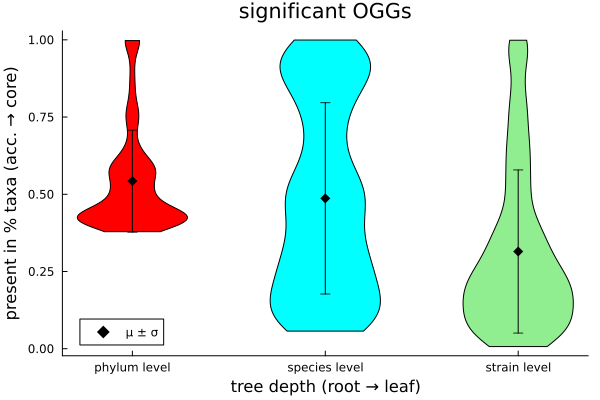

In [58]:
@df uniqueOGGresults violin(string.(:tree_level),:ogg_freqs,
    group=string.(:tree_level),
    title="significant OGGs",
    xlabel="tree depth (root → leaf)",
    ylabel="present in % taxa (acc. → core)",
    label="",
    c=[:red :aqua :lightgreen],
    # alpha=.3,
    grid=false,
)

# @df uniqueOGGresults dotplot!(string.(:tree_level),:ogg_freqs,
#     group=string.(:tree_level),
#     label="",
#     c=:grey,
#     # alpha=.3,
#     grid=false,
#     markersize=1,
#     alpha=.5,
# )

uniqueOGGresults |>
    df->groupby(df, :tree_level) |>
    df->DataFrames.combine(df, :ogg_freqs => mean, :ogg_freqs => std) |>
    df-> @df df scatter!(
            string.(:tree_level), 
            :ogg_freqs_mean, 
            yerrorbar=:ogg_freqs_std,
            label="µ ± σ",
            c=:black,
            markershape=:diamond,
            markersize=5,
            legend=:bottomleft,
    )

In [727]:
savefig(joinpath(pdir, "corevsaccesory_violin.pdf"))

"/Users/ben/projects/Doran_etal_2022/plots/donor_strainlevel_variation/corevsaccesory_violin.pdf"

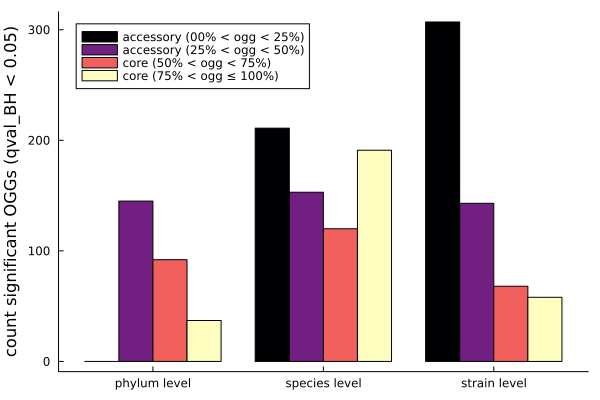

In [59]:
coreacc = cut(uniqueOGGresults.ogg_freqs, [0, .25, .5, .75, 1], extend=true);
recode!(coreacc,  
    "[0.0, 0.25)" => "Q1",
    "[0.25, 0.5)" => "Q2",
    "[0.5, 0.75)" => "Q3",
    "[0.75, 1.0]" => "Q4",
)

treelevel = string.(uniqueOGGresults.tree_level);
groupedbar(freqtable(treelevel,coreacc), 
    c=permutedims(palette(:magma, 4).colors.colors),
    label=["accessory (00% < ogg < 25%)" "accessory (25% < ogg < 50%)" "core (50% < ogg < 75%)" "core (75% < ogg ≤ 100%)"],
    xticks = (1:3, unique(treelevel)),
    grid=false,
    ylabel="count significant OGGs (qval_BH < 0.05)",
)

In [724]:
savefig(joinpath(pdir, "corevsaccesory_barplot_4level-binning.pdf"))

"/Users/ben/projects/Doran_etal_2022/plots/donor_strainlevel_variation/corevsaccesory_barplot_4level-binning.pdf"

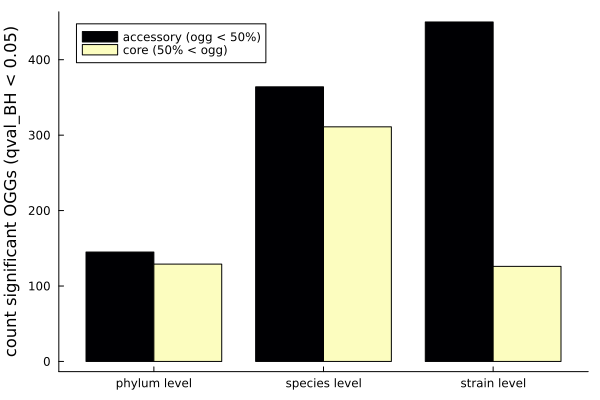

In [60]:
coreacc = cut(uniqueOGGresults.ogg_freqs, [0, .5, 1], extend=true);
recode!(coreacc,  
    "[0.0, 0.5)" => "accessory",
    "[0.5, 1.0]" => "core",
)
treelevel = string.(uniqueOGGresults.tree_level);
groupedbar(freqtable(treelevel, coreacc), 
    c=permutedims(palette(:magma, 2).colors.colors),
    label=["accessory (ogg < 50%)" "core (50% < ogg)"],
    xticks = (1:3, unique(treelevel)),
    grid=false,
    ylabel="count significant OGGs (qval_BH < 0.05)",
)

In [721]:
savefig(joinpath(pdir, "corevsaccesory_barplot_2level-binning.pdf"))

"/Users/ben/projects/Doran_etal_2022/plots/donor_strainlevel_variation/corevsaccesory_barplot_2level-binning.pdf"

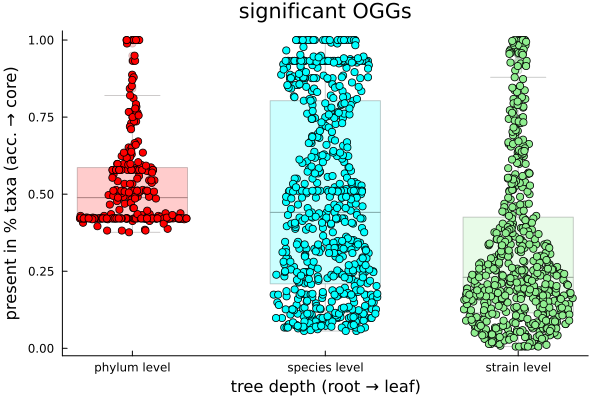

In [718]:
@df uniqueOGGresults boxplot(string.(:tree_level),:ogg_freqs,
    group=string.(:tree_level),
    title="significant OGGs",
    xlabel="tree depth (root → leaf)",
    ylabel="present in % taxa (acc. → core)",
    label="",
    c=[:red :aqua :lightgreen],
    alpha=.2,
    grid=false,
)
@df uniqueOGGresults dotplot!(string.(:tree_level),:ogg_freqs,
    group=string.(:tree_level),
    title="significant OGGs",
    xlabel="tree depth (root → leaf)",
    ylabel="present in % taxa (acc. → core)",
    label="",
    c=[:red :aqua :lightgreen],
    # alpha=.3,
    grid=false,
)

In [719]:
savefig(joinpath(pdir, "corevsaccesory_dotplot_and_boxplot.pdf"))

"/Users/ben/projects/Doran_etal_2022/plots/donor_strainlevel_variation/corevsaccesory_dotplot_and_boxplot.pdf"

## Plot actual OGGS next to subsettree

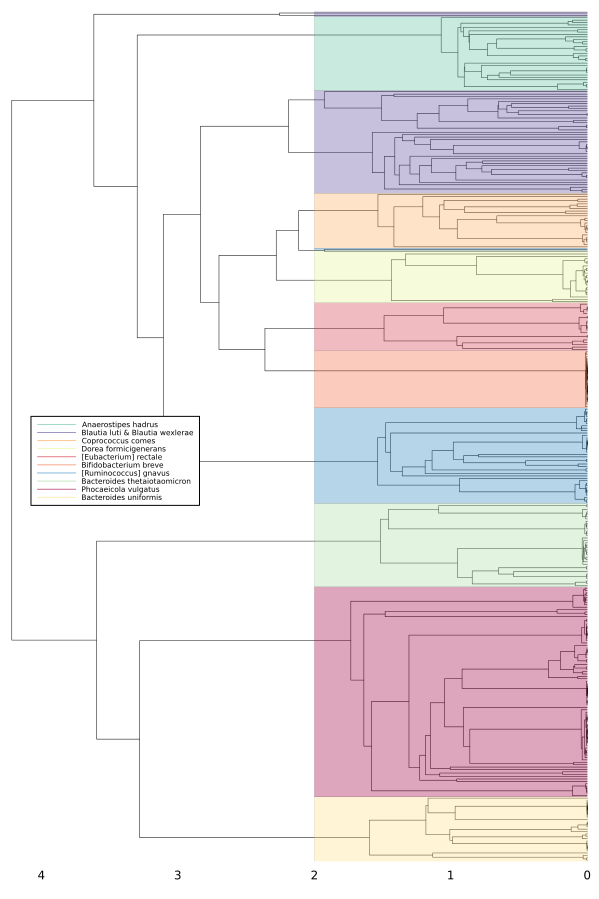

In [47]:
# speciescolors = shuffle(permutedims(palette(:Spectral_10, 10).speciescolors.colors))
rectangle(w, h, x, y) = Shape(x .+ [0,w,w,0], y .+ [0,0,h,h])
speciesvector = bbobs_trn.species[subsettree_hc.order]
length(unique(speciesvector))

breaks = findall(speciesvector[begin:(end-1)] .!= speciesvector[2:end])[Not([10, 11, 12, 13, 14,15])]
edges = [(s, e) for (s,e) in zip(vcat([0],breaks), vcat(breaks, [length(speciesvector)]))];
rects = [rectangle(2,(e-s),0,s+.5) for (s,e) in zip(vcat([0],breaks), vcat(breaks, [length(speciesvector)]))];

plot(subsettree_hc, 
    size=(600, 900),
    lw=.5,
    yflip=true, 
    xmirror=true,
    xticks=:none,
    permute=(:y, :x),
    grid=false,
    tickdirection=:none,
    rightmargin=1Plots.Measures.mm, 
    label="",
    framestyle=:grid,
)
plot!(permutedims(rects[Not(8, 12)]), fill=0.35, lw=0, c=speciescolors, label="")
plot!(rects[8], fill=0.35, lw=0, c=speciescolors[4], label="")
plot!(rects[12], fill=0.35, lw=0, c=speciescolors[9], label="")
specieslabels= [
    "Bacteroides uniformis",
    "Phocaeicola vulgatus",
    "Bacteroides thetaiotaomicron",
    "[Ruminococcus] gnavus",
    "Bifidobacterium breve",
    "[Eubacterium] rectale",
    "Dorea formicigenerans",
    "Coprococcus comes",
    "Blautia luti & Blautia wexlerae",
    "Anaerostipes hadrus",
]
fancy_treeplot = plot!(zeros(1, 10), 
    legend=:left,
    labels=permutedims(reverse(specieslabels)), 
    c=reverse(speciescolors),
    legendfontsize=5,
)


### Global tests

In [48]:
ogg_plotting_order = uniqueOGGresults |>
    df->subset(df,  :grp1_N => x-> x.>=3, :grp2_N => x-> x.>=3) |>
    df->subset(df, :nodeids => (x->get.(Ref(countmap(x)), x, 0) .> 10)) |>
    df->sort(df, [:nodeids, :log2FC]);

In [50]:
leaves = getleaves(tree)
leafnames = name.(leaves);
treeorder = indexin(leafnames, trnYdf.ID);

ogg_mtx = bbmtx_trn[treeorder, :];

In [56]:
suppmtx = hcat(
    bbobs_trn[treeorder, [:ID, :species]],
    DataFrame(ogg_mtx, biobank["oggs"].var_names[ogg_mask]|>vec)
) 
CSV.write(joinpath(rdir, "Table_S3a_full.csv"), suppmtx)
CSV.write(joinpath(rdir, "Table_S3b_sig.csv"), suppmtx[:, vcat([1,2], ogg_plotting_order.ogg_idx .+ 2)])

"/Users/ben/projects/Doran_etal_2022/_research/donor_strainlevel_variation/Table_S3b_sig.csv"

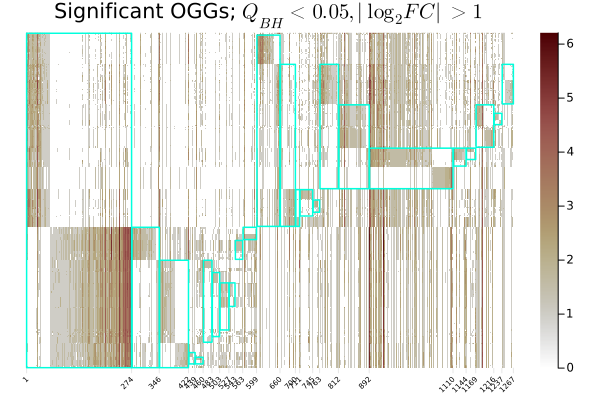

In [57]:
hmapplot = heatmap(log2.(ogg_mtx[:, ogg_plotting_order.ogg_idx] .+ 1), 
# hmapplot = heatmap(log2.(ogg_mtx[:, uniqueOGGresults.ogg_idx]),
    title="Significant OGGs; " * L"Q_{BH} < 0.05, |\log_2 FC| > 1",
    yticks=false,
    # xticks=(1:nrow(uniqueOGGresults), uniqueOGGresults.ogg_name),
    xticks=[1, findall(diff(ogg_plotting_order.nodeids) .!= 0)...,nrow(ogg_plotting_order)],
    # xtickfontsize=1,
    xrotation=45,
    ylims=(.5,356.5),
    tickdirection=:out,
    xtickfontsize=5,
    framestyle=:grid,
    cticks=(1:4, string.(2 .^ 1:4)),
    c=:bilbao, grid=false);

rectangle(w, h, x, y) = Shape(x .+ [0,w,w,0], y .+ [0,0,h,h])
leafnames = getleafnames(subsettree)
oggrects = map(unique(ogg_plotting_order.nodeids)) do nid
    node = filter(x-> id(x)==(nid), prewalk(subsettree))[1]
    idx_taxa = indexin(getleafnames(node), leafnames)
    noderesults = filter(:nodeids => ==(nid), ogg_plotting_order)
    idx_oggs = indexin(noderesults.ogg_name, ogg_plotting_order.ogg_name)
    x = minimum(idx_oggs)
    y = minimum(idx_taxa)
    width = maximum(idx_oggs) - minimum(idx_oggs)
    height = maximum(idx_taxa) - minimum(idx_taxa)
    rectangle(width, height, x, y)
end

plot!(permutedims(oggrects), fill=0.0, lw=1.5, linecolor="#00FFDD", label="")


# vline!(findall(diff(ogg_plotting_order.nodeids) .> 0) .- .5, lw=1, c=:black, label="")

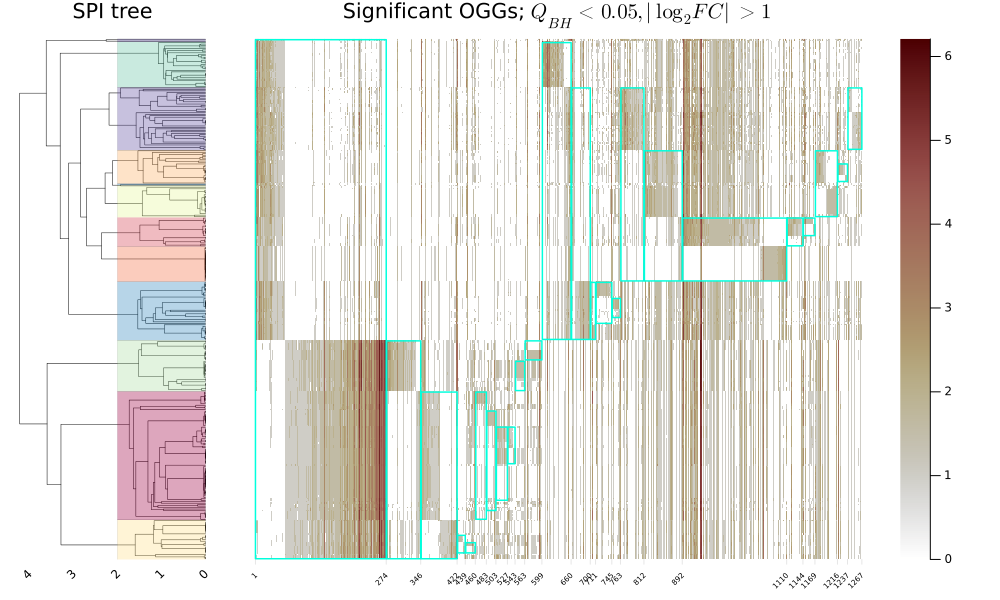

In [116]:
layout = @layout [a{.2w} b]
plot(plot(fancy_treeplot, title="SPI tree"), hmapplot; layout, xrotation=45, size=(1000,600), link=:y, legend=:none, margin=3Plots.Measures.mm)

In [117]:
savefig(joinpath(pdir, "significantOGGS_pernode_treeandheatmap_coloredboxes.pdf"))

"/Users/ben/projects/Doran_etal_2022/plots/donor_strainlevel_variation/significantOGGS_pernode_treeandheatmap_coloredboxes.pdf"

### Strain level tests

In [120]:
ogg_plotting_order = uniqueOGGresults |>
    df->subset(df,  :tree_level => x-> x.==("strain level"), :grp1_N => x-> x.>=3, :grp2_N => x-> x.>=3) |>
    df->subset(df, :nodeids => (x->get.(Ref(countmap(x)), x, 0) .> 10)) |>
    df->sort(df, [:nodeids, :log2FC]);

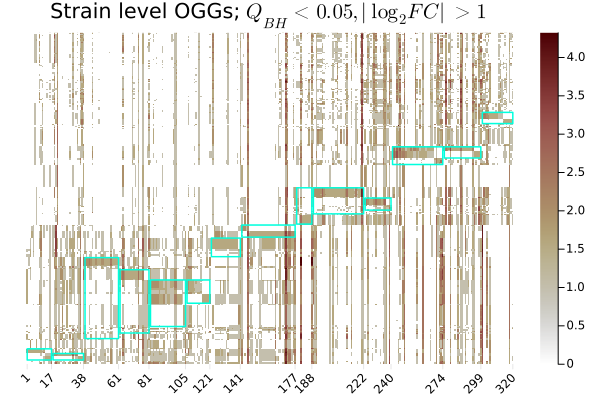

In [121]:
hmapplot = heatmap(log2.(ogg_mtx[:, ogg_plotting_order.ogg_idx] .+ 1), 
# hmapplot = heatmap(log2.(ogg_mtx[:, uniqueOGGresults.ogg_idx]),
    title="Strain level OGGs; " * L"Q_{BH} < 0.05, |\log_2 FC| > 1",
    yticks=false,
    # xticks=(1:nrow(uniqueOGGresults), uniqueOGGresults.ogg_name),
    xticks=[1, findall(diff(ogg_plotting_order.nodeids) .!= 0)...,nrow(ogg_plotting_order)],
    # xtickfontsize=1,
    xrotation=45,
    ylims=(.5,356.5),
    tickdirection=:out,
    framestyle=:grid,
    cticks=(1:4, string.(2 .^ 1:4)),
    c=:bilbao, grid=false);

rectangle(w, h, x, y) = Shape(x .+ [0,w,w,0], y .+ [0,0,h,h])
leafnames = getleafnames(subsettree)
oggrects = map(unique(ogg_plotting_order.nodeids)) do nid
    node = filter(x-> id(x)==(nid), prewalk(subsettree))[1]
    idx_taxa = indexin(getleafnames(node), leafnames)
    noderesults = filter(:nodeids => ==(nid), ogg_plotting_order)
    idx_oggs = indexin(noderesults.ogg_name, ogg_plotting_order.ogg_name)
    x = minimum(idx_oggs)
    y = minimum(idx_taxa)
    width = maximum(idx_oggs) - minimum(idx_oggs)
    height = maximum(idx_taxa) - minimum(idx_taxa)
    rectangle(width, height, x, y)
end

plot!(permutedims(oggrects), fill=0.0, lw=1.5, linecolor="#00FFDD", label="")


# vline!(findall(diff(ogg_plotting_order.nodeids) .> 0) .- .5, lw=1, c=:black, label="")

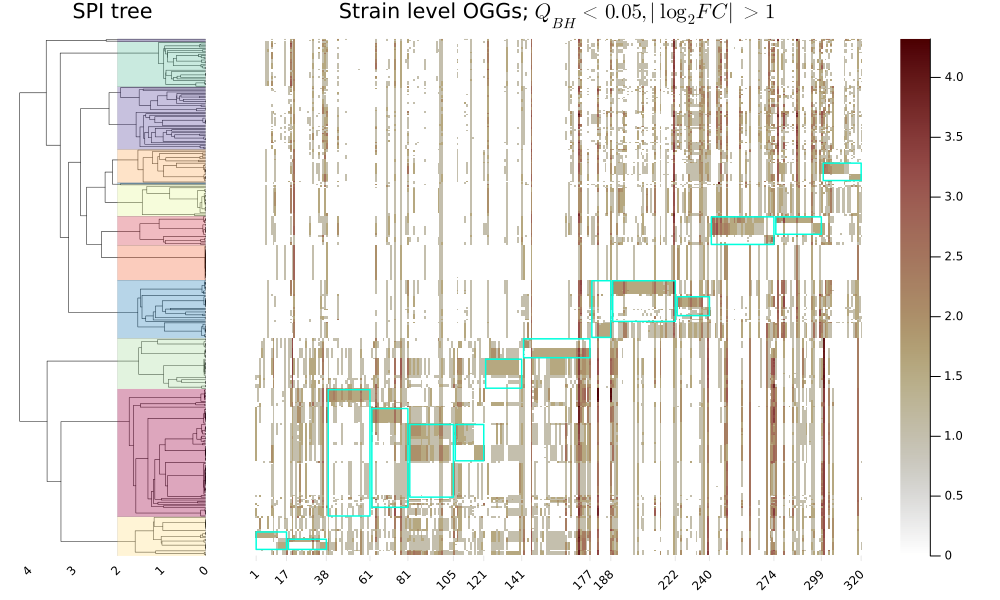

In [125]:
layout = @layout [a{.2w} b]
plot(plot(fancy_treeplot, title="SPI tree"), hmapplot; layout, xrotation=45, size=(1000,600), link=:y, legend=:none, margin=3Plots.Measures.mm)


In [126]:
savefig(joinpath(pdir, "significantOGGS_pernode_strainlevel_treeandheatmap_coloredboxes.pdf"))

"/Users/ben/projects/Doran_etal_2022/plots/donor_strainlevel_variation/significantOGGS_pernode_strainlevel_treeandheatmap_coloredboxes.pdf"

## compare strain level metabolite significance to ogg significance

In [58]:
COGannotations = CSV.read(datadir("exp_raw", "UP7047", "UPcolmeta.csv"), DataFrame);

In [128]:
subset(sigtestresults_metab, :tree_level => x-> x .== "strain level", :metabolite_name => x-> x.=="Acetate")

Row,nodeids,nodeheight,nodedepth,grp1_N,grp2_N,grp1_phylum_mode,grp2_phylum_mode,grp1_species_mode,grp2_species_mode,grp1_species_donor_mode,grp2_species_donor_mode,metabolite_name,metabolite_idx,metabolite_freqs,grp1_prp_exp,grp2_prp_exp,effectsize,logeffectsize,log2FC,cliffs_d,pvals,qvals,pval_BH,pval_Bon,qval_BH,tree_level
,Int64,Float64,Float64,Int64,Int64,String15,String15,String31,String31,String31,String31,String31,Int64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,String15
1,435,3.30166,0.914283,2,3,Firmicutes,Firmicutes,[Eubacterium] rectale,[Eubacterium] rectale,[Eubacterium] rectale_9,[Eubacterium] rectale_13,Acetate,1,0.859551,0.0,1.0,1.11466,1.11466,-1.39884,-1.0,0.2,0.0,0.80479,1.0,0.0,strain level


In [129]:
subset(sigtestresults_metab, :tree_level => x-> x .== "strain level", :metabolite_name => x-> x.=="Butyrate")

Row,nodeids,nodeheight,nodedepth,grp1_N,grp2_N,grp1_phylum_mode,grp2_phylum_mode,grp1_species_mode,grp2_species_mode,grp1_species_donor_mode,grp2_species_donor_mode,metabolite_name,metabolite_idx,metabolite_freqs,grp1_prp_exp,grp2_prp_exp,effectsize,logeffectsize,log2FC,cliffs_d,pvals,qvals,pval_BH,pval_Bon,qval_BH,tree_level
,Int64,Float64,Float64,Int64,Int64,String15,String15,String31,String31,String31,String31,String31,Int64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,String15
1,483,4.20676,0.00918547,2,2,Firmicutes,Firmicutes,Dorea formicigenerans,Dorea formicigenerans,Dorea formicigenerans_1,Dorea formicigenerans_1,Butyrate,2,0.30618,0.0,0.0,5.58536,5.58536,-5.18761,-1.0,0.333333,0.0,0.949958,1.0,0.0,strain level


In [130]:
subset(sigtestresults_metab, :tree_level => x-> x .== "strain level", :metabolite_name => x-> x.=="Glycine")

Row,nodeids,nodeheight,nodedepth,grp1_N,grp2_N,grp1_phylum_mode,grp2_phylum_mode,grp1_species_mode,grp2_species_mode,grp1_species_donor_mode,grp2_species_donor_mode,metabolite_name,metabolite_idx,metabolite_freqs,grp1_prp_exp,grp2_prp_exp,effectsize,logeffectsize,log2FC,cliffs_d,pvals,qvals,pval_BH,pval_Bon,qval_BH,tree_level
,Int64,Float64,Float64,Int64,Int64,String15,String15,String31,String31,String31,String31,String31,Int64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,String15
1,483,4.20676,0.00918547,2,2,Firmicutes,Firmicutes,Dorea formicigenerans,Dorea formicigenerans,Dorea formicigenerans_1,Dorea formicigenerans_1,Glycine,19,0.457865,0.0,0.0,1.58535,1.58535,1.43531,1.0,0.333333,0.0,0.949958,1.0,0.0,strain level


In [131]:
# no significant OGGs explaining strain level change of Glycine or Butyrate at node 483
sigtestresults |> df -> subset(df, :nodeids => x->x.==483) 

Row,nodeids,nodeheight,nodedepth,grp1_N,grp2_N,grp1_phylum_mode,grp2_phylum_mode,grp1_species_mode,grp2_species_mode,grp1_species_donor_mode,grp2_species_donor_mode,ogg_name,ogg_idx,ogg_freqs,grp1_prp_exp,grp2_prp_exp,effectsize,logeffectsize,log2FC,cliffs_d,pvals,qvals,pval_BH,pval_Bon,qval_BH,tree_level
,Int64,Float64,Float64,Int64,Int64,String15,String15,String31,String31,String31,String31,String15,Int64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,String15


In [132]:
sigtestresults[!, :isgrp1] = Int.(sign.(sigtestresults.log2FC) .>= 0);
sigoggs_at_acetatenode = subset(sigtestresults, :nodeids => x->x .== 435) |>
    df->sort(df, :isgrp1);

In [133]:
acatatenode = filter(n->id(n)==435, prewalk(subsettree))[1]
getleafnames(acatatenode.children[1])

2-element Vector{String}:
 "MSK.9.15"
 "MSK.9.13"

In [134]:
getleafnames(acatatenode.children[2])

3-element Vector{String}:
 "MSK.13.50"
 "MSK.13.48"
 "MSK.13.59"

In [135]:
acetate_drivers = filter(:og => x->.∈(x, Ref(sigoggs_at_acetatenode.ogg_name)), COGannotations)
acetate_drivers[!, :isgrp1] = sigoggs_at_acetatenode.isgrp1[indexin(acetate_drivers.og, sigoggs_at_acetatenode.ogg_name)]
acetate_drivers[!, :log2FC] = sigoggs_at_acetatenode.log2FC[indexin(acetate_drivers.og, sigoggs_at_acetatenode.ogg_name)]
acetate_drivers[!, :grp1_species_donor_mode] .= unique(sigoggs_at_acetatenode.grp1_species_donor_mode)
acetate_drivers[!, :grp2_species_donor_mode] .= unique(sigoggs_at_acetatenode.grp2_species_donor_mode)
sort(acetate_drivers, :isgrp1);

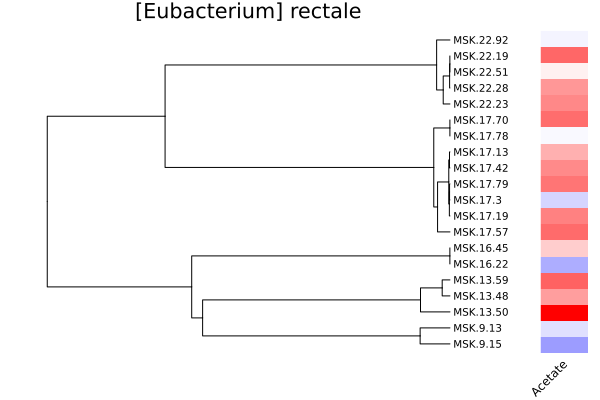

In [136]:

## Get species tree

speciesname = "[Eubacterium] rectale"
subsettree = readnw(SPI.nwstr(subsettree_hc, trnYdf.ID; labelinternalnodes=false));
leaves = getleaves(subsettree)
leafnames = name.(leaves);

treeorder = indexin(leafnames, trnYdf.ID);
isspecies = contains.(trnYdf.species[treeorder], speciesname);
speciesparent = NewickTree.extract(subsettree, leafnames[isspecies]) |>
    NewickTree.nwstr |>
    readnw

speciesparent_leafnames = getleafnames(speciesparent)

# # remove names of leaves for plotting
# map(prewalk(speciesparent)) do node
#     NewickTree.setname!(node, "")
# end;

speciestreeplot = plot(speciesparent, fs = 7, title="$speciesname", rightmargin=15Plots.Measures.mm)

metabolite_conc = metab_trnY[filter(!isnothing, indexin(speciesparent_leafnames, trnYdf.ID)), findfirst(==("Acetate"), orderedmetabolites_names)]
clims = extrema(metabolite_conc) |> x->abs.(x) |> maximum |> x->(-x, x)
metabplot = heatmap(metabolite_conc[:, :], c=:bwr, clims=clims, framestyle=:grid, grid=false, yticks=false, xticks=(1, ["Acetate"]), xrotation=45, colorbar=:none)

layout = @layout [a{.9w} b]
plot(speciestreeplot, metabplot; layout)

In [137]:
uniqueOGGresults[!, :isgrp1] = uniqueOGGresults[!, :isgrp1] = Int.(sign.(uniqueOGGresults.log2FC) .>= 0);

In [138]:
node433_sigoggs = filter(:nodeids => ==(433), uniqueOGGresults) |> 
    df->sort(df, [:isgrp1, :log2FC]);

In [139]:
signode433_oggnames = bboggnames[indexin(node433_sigoggs.ogg_name, bboggnames)];

In [140]:
oggdescriptions = leftjoin(DataFrame(:og => signode433_oggnames), filter(:og => x->.∈(x, Ref(signode433_oggnames)), COGannotations), on=:og)[:, [:og, :description]]
xlabs = oggdescriptions[indexin(signode433_oggnames, oggdescriptions.og), :].description |>
    x->coalesce.(x, "") |>
    x->replace.(x, r"\(.*\)"=>"") |>
    x->first.(x, 50);

In [141]:
species_sigatnode433_oggmtx = bbmtx_trn[
    filter(!isnothing, indexin(speciesparent_leafnames, trnYdf.ID)), 
    indexin(node433_sigoggs.ogg_name, bboggnames)];

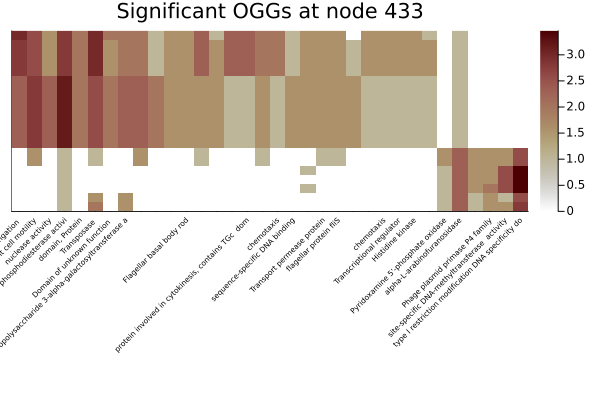

In [142]:
oggplot = heatmap(log2.(species_sigatnode433_oggmtx .+ 1),
     title="Significant OGGs at node 433",
     xticks=(1:length(xlabs), xlabs),
     yticks=false,
     xrotation=45, 
     xtickfontsize=5,
     c=:bilbao,
     bottommargin=20Plots.Measures.mm,
)

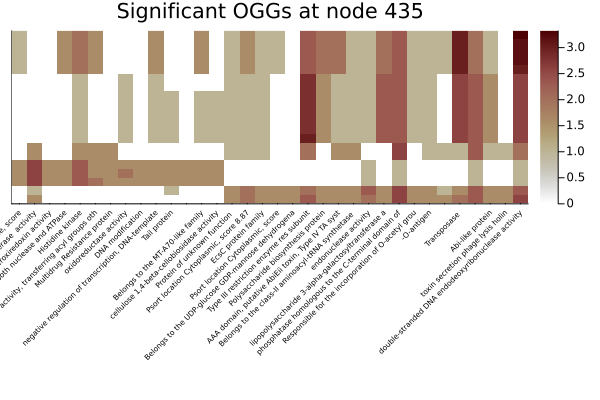

In [143]:
oggacetatenames = acetate_drivers.og[filter(!isnothing, indexin(sigoggs_at_acetatenode.ogg_name, acetate_drivers.og))];
xlabs_acetate = acetate_drivers.description[filter(!isnothing, indexin(sigoggs_at_acetatenode.ogg_name, acetate_drivers.og))] |>
    x->coalesce.(x, "") |>
    x->replace.(x, r"\(.*\)"=>"") |>
    x->first.(x, 50)

species_sigatnode435_oggmtx = bbmtx_trn[
    filter(!isnothing, indexin(speciesparent_leafnames, trnYdf.ID)), 
    indexin(oggacetatenames, bboggnames)];

oggplot_acetate = heatmap(log2.(species_sigatnode435_oggmtx .+ 1),
     title="Significant OGGs at node 435",
     xticks=(1:length(xlabs_acetate), xlabs_acetate),
     yticks=false,
     xrotation=45, 
     xtickfontsize=5,
     c=:bilbao,
     bottommargin=20Plots.Measures.mm,
)

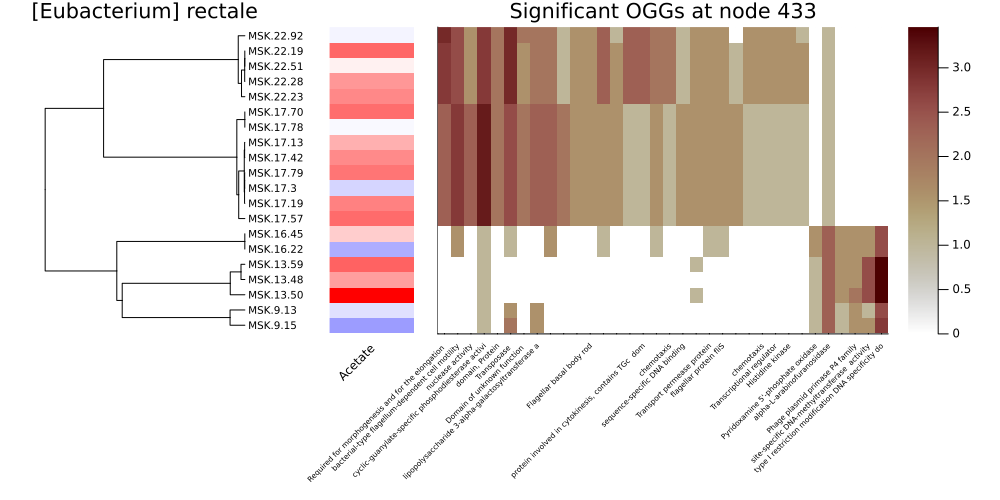

In [152]:
layout = @layout [a{.25w} b{.1w} c]
plot(speciestreeplot, metabplot, oggplot; layout, size=(1000, 500))

In [153]:
savefig(joinpath(pdir, "Erectale_node433_acetate.pdf"))

"/Users/ben/projects/Doran_etal_2022/plots/donor_strainlevel_variation/Erectale_node433_acetate.pdf"

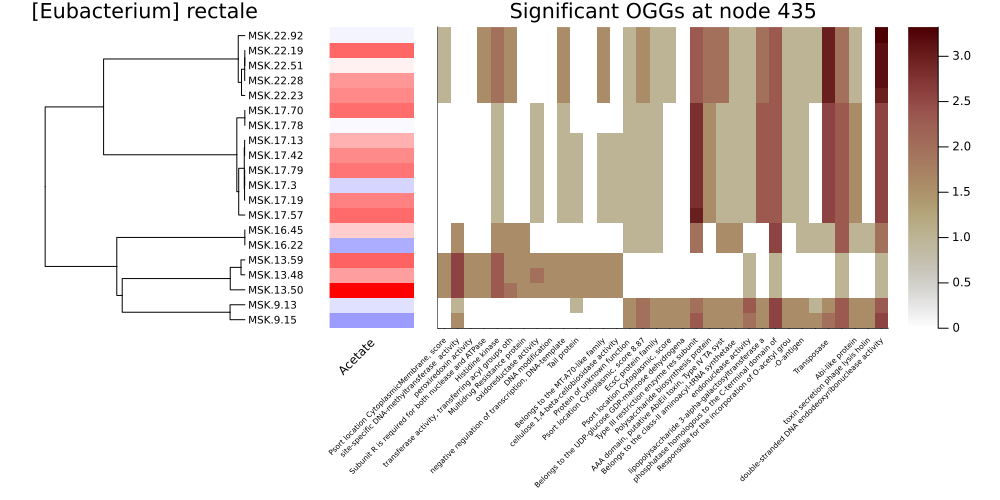

In [164]:
layout = @layout [a{.25w} b{.1w} c]
plot(speciestreeplot, metabplot, oggplot_acetate; layout, size=(1000, 500))

In [165]:
savefig(joinpath(pdir, "Erectale_node435_acetate.pdf"))

"/Users/ben/projects/Doran_etal_2022/plots/donor_strainlevel_variation/Erectale_node435_acetate.pdf"

## Plot strain level subtrees

In [21]:
pdir_subdir = joinpath(pdir, "straintrees")

"/Users/ben/projects/Doran_etal_2022/plots/donor_strainlevel_variation/straintrees"

In [44]:
oldids

25-element Vector{Int64}:
 13
 14
 15
 16
 17
 18
 19
 20
 21
 22
  ⋮
 29
 30
 31
 32
 33
 34
 35
 36
 37

In [114]:
subtree = filter(n->id(n) == 13, prewalk(deepcopy(subsettree)))[1]
oldids = [Int(id(n)) for n in prewalk(subtree)]
subtree = subtree |> NewickTree.nwstr |> readnw

(((((MSK.19.71:0.001116743,(MSK.19.54:0.0001738008,MSK.19.4:0.0001738008):0.0009429425):0.001027894,MSK.19.91:0.002144637):0.0006451383,MSK.19.84:0.002789775):0.9853182,(MSK.20.30:0.03613531,(MSK.20.3:0.009151378,MSK.20.79:0.009151378):0.02698393):0.9519726):0.01828051,(MSK.16.71:0.1179327,(MSK.16.7:0.06787214,(MSK.16.46:0.001618285,(MSK.16.44:0.0001595074,MSK.16.39:0.0001595074):0.001458778):0.06625386):0.05006053):0.8884558);

In [111]:
using AbstractTrees: PreOrderDFS, treemap

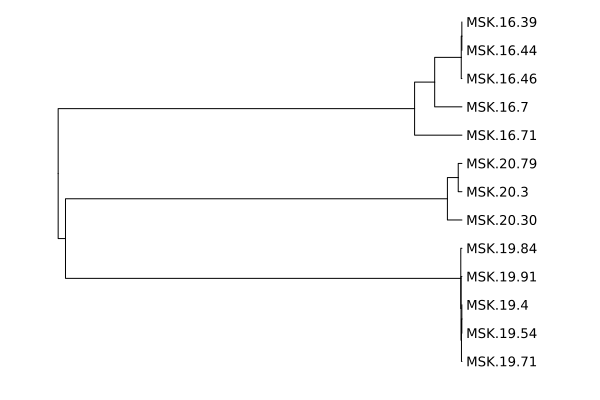

In [115]:
plot(subtree, 
    rightmargin=30Plots.Measures.mm
)

In [122]:
include(srcdir("helpers.jl"))

ladderize! (generic function with 1 method)

In [125]:
subtree = filter(n->id(n) == 57, prewalk(deepcopy(subsettree)))[1]
ladderize!(subtree)
oldids = [Int(id(n)) for n in prewalk(subtree)]
map(prewalk(subtree)) do node
    if Int(id(node)) == 136
        NewickTree.setname!(node, "sig")
    end
end;
subtree = subtree |> NewickTree.nwstr |> readnw

((MSK.7.27:0.1047519,((MSK.8.30:0.01584241,MSK.8.17:0.01584241):0.01100614,(MSK.8.31:0.01858135,((MSK.8.25:0.008360049,MSK.8.24:0.008360049):0.008220332,(MSK.7.25:0.01364896,(MSK.8.9:0.009811226,MSK.7.15:0.009811226):0.003837738):0.002931416):0.00200097):0.008267197):0.07790337):1.62697,((MSK.17.73:1.480551,(MSK.20.28:0.2212779,(MSK.20.41:0.01663719,MSK.20.27:0.01663719):0.2046407):1.259273):0.1557837,((DFI.3.23:0.1084715,(DFI.1.146:0.01194217,(DFI.1.126:0.004400213,(DFI.1.127:0.002878789,(DFI.1.133:0.002279274,DFI.1.35:0.002279274):0.0005995152):0.001521423):0.007541952):0.09652931):1.471801,((MSK.17.64:0.03981748,((MSK.17.55:0.003196651,MSK.17.67:0.003196651):0.01557826,(MSK.17.92:0.004235512,(MSK.17.93:0.003962724,((MSK.17.87:0.001715472,MSK.17.65:0.001715472):0.001395017,(MSK.17.56:0.002300801,(MSK.17.91:0.001673238,(MSK.17.71:0.0007187355,MSK.17.5:0.0007187355):0.0009545024):0.0006275626):0.0008096886):0.0008522348):0.0002727882):0.01453939):0.02104258):1.266088,((DFI.5.25:0.95578

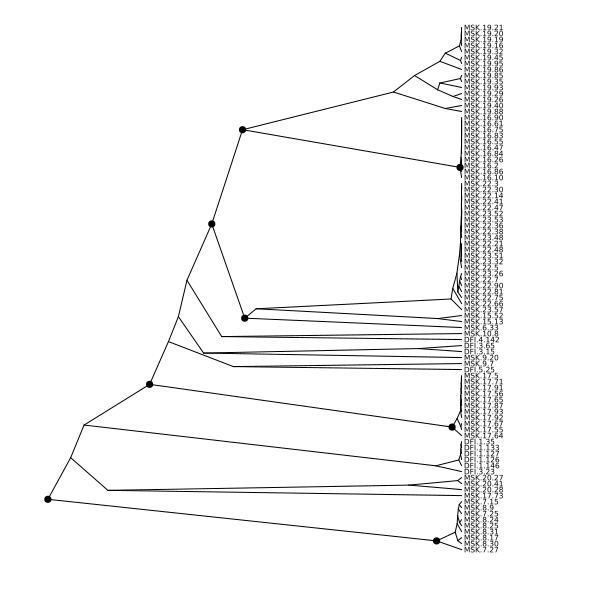

In [131]:
showsignodes = float.(permutedims((oldids .∈ Ref([57, 71, 86, 136]))))
# showsignodes = float.(permutedims((oldids .∈ Ref([136]))))
plot(subtree, 
    marker = true,
    # markersize=permutedims((oldids .∈ Ref([57, 71, 86, 136]))),
    markeralpha=showsignodes,
    internal=true,
    size=(600,600), 
    fs = 5, 
    sq=false,
    rightmargin=30Plots.Measures.mm
)

In [135]:
subtree = filter(n->id(n) == 304, prewalk(deepcopy(subsettree)))[1]
ladderize!(subtree, rev=true)
oldids = [Int(id(n)) for n in prewalk(subtree)]
subtree = subtree |> NewickTree.nwstr |> readnw

((((((((((((((MSK.15.9:2.94916e-17,MSK.15.10:2.94916e-17):0.0005510349,MSK.15.18:0.0005510349):0.000398879,MSK.15.56:0.000949914):0.0009573024,MSK.15.58:0.001907216):0.0005941104,MSK.15.54:0.002501327):0.001782518,MSK.15.59:0.004283845):0.03148856,MSK.15.32:0.03577241):0.9460078,(((MSK.19.33:0.06707205,MSK.19.38:0.06707205):0.3834988,(MSK.17.82:0.005630039,MSK.17.63:0.005630039):0.4449408):0.4552386,(MSK.5.19:0.7976107,MSK.11.9:0.7976107):0.1081987):0.07597088):0.1550013,(MSK.7.28:0.008891872,MSK.7.31:0.008891872):1.12789):0.05073667,MSK.15.77:1.187518):0.1680361,MSK.5.17:1.355554):0.08524652,MSK.7.5:1.440801):0.03602388,(((((MSK.23.92:0.002371883,MSK.23.91:0.002371883):0.004679261,MSK.23.82:0.007051144):0.006038249,MSK.23.60:0.01308939):0.007631856,((MSK.23.41:0.003403041,MSK.23.81:0.003403041):0.004076751,MSK.22.24:0.007479792):0.01324146):0.05899903,((MSK.23.20:0.04056606,MSK.23.17:0.04056606):0.003199687,MSK.23.4:0.04376574):0.03595454):1.397104):0.05861643,(((((((MSK.23.46:0.00213

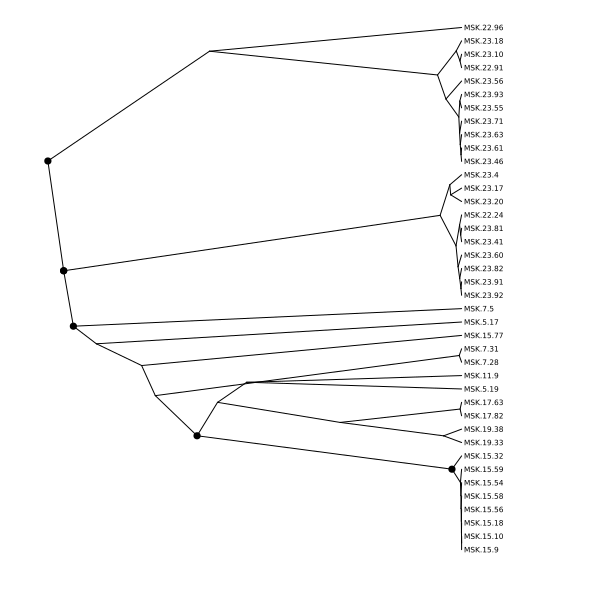

In [140]:
showsignodes = float.(permutedims((oldids .∈ Ref([304, 326, 336]))))
# showsignodes = float.(permutedims((oldids .∈ Ref([304]))))
plot(subtree, 
    marker = true,
    # markersize=permutedims((oldids .∈ Ref([57, 71, 86, 136]))),
    markeralpha=showsignodes,
    internal=true,
    size=(600,600), 
    fs = 5, 
    sq=false,
    rightmargin=30Plots.Measures.mm
)

In [147]:
subtree = filter(n->id(n) == 233, prewalk(deepcopy(subsettree)))[1]
ladderize!(subtree, rev=true)
oldids = [Int(id(n)) for n in prewalk(subtree)]
subtree = subtree |> NewickTree.nwstr |> readnw

(((((((((DFI.1.239:0.004891845,DFI.1.238:0.004891845):0.002316509,DFI.1.228:0.007208354):0.004196748,((DFI.2.27:0.0074562,DFI.1.54:0.0074562):0.002341859,DFI.1.150:0.009798059):0.001607043):0.0107179,(DFI.1.170:0.00910144,DFI.1.169:0.00910144):0.01302156):0.002934123,DFI.1.128:0.02505713):0.003180988,DFI.1.229:0.02823812):0.003638711,DFI.1.47:0.03187683):0.005067316,DFI.1.236:0.03694414):0.9148079,(((((MSK.14.51:0.00243926,MSK.15.48:0.00243926):0.001744211,MSK.15.45:0.004183471):0.5352159,MSK.18.2:0.5393994):0.111049,(MSK.5.5:0.006865608,MSK.5.9:0.006865608):0.6435827):0.1922264,((DFI.4.151:0.005295598,DFI.4.133:0.005295598):0.08273538,DFI.4.108:0.08803098):0.7546437):0.1090774);

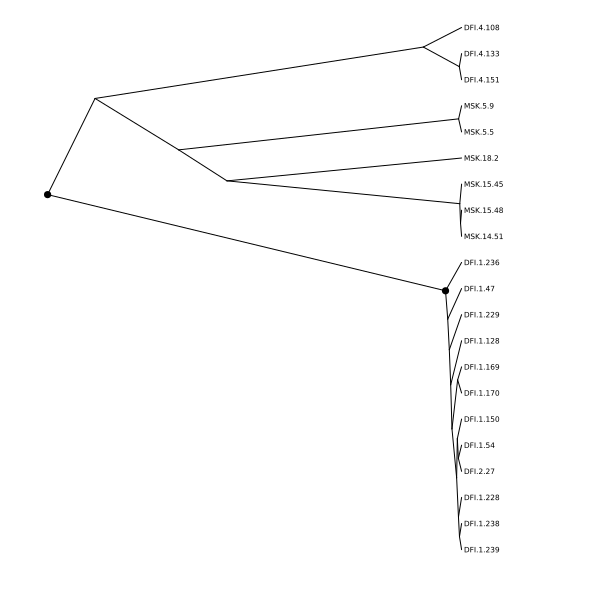

In [148]:
showsignodes = float.(permutedims((oldids .∈ Ref([233, 274]))))
# showsignodes = float.(permutedims((oldids .∈ Ref([304]))))
plot(subtree, 
    marker = true,
    # markersize=permutedims((oldids .∈ Ref([57, 71, 86, 136]))),
    markeralpha=showsignodes,
    internal=true,
    size=(600,600), 
    fs = 5, 
    sq=false,
    rightmargin=30Plots.Measures.mm
)

In [151]:
subtree = filter(n->id(n) == 274, prewalk(deepcopy(subsettree)))[1]
ladderize!(subtree, rev=true)
oldids = [Int(id(n)) for n in prewalk(subtree)]
subtree = subtree |> NewickTree.nwstr |> readnw

(((((MSK.16.35:0.002686137,MSK.16.65:0.002686137):0.00144486,MSK.16.60:0.004130997):0.004142534,MSK.16.62:0.008273531):0.008968148,((MSK.16.57:0.002797762,MSK.16.43:0.002797762):0.0009232938,MSK.16.9:0.003721056):0.01352062):1.440133,(((((MSK.23.45:0.002134073,MSK.23.25:0.002134073):0.003841595,MSK.23.49:0.005975667):0.004767436,MSK.23.85:0.0107431):0.02427398,MSK.23.42:0.03501708):1.053664,(DFI.2.13:0.002545152,DFI.2.69:0.002545152):1.086136):0.3686933);

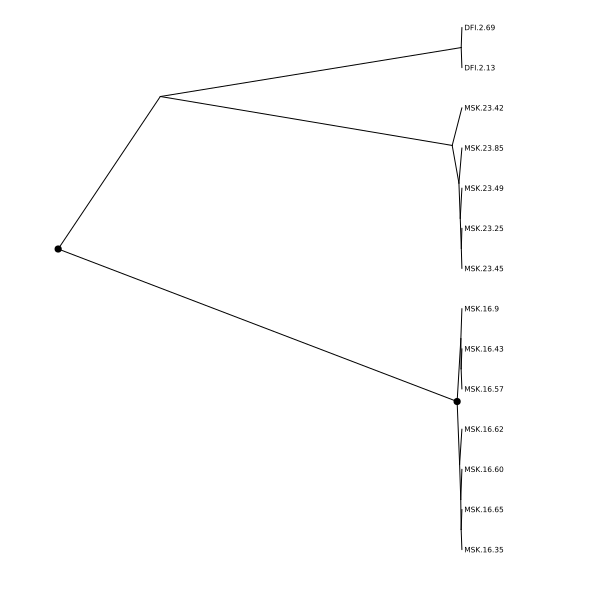

In [152]:
showsignodes = float.(permutedims((oldids .∈ Ref([233, 274]))))
# showsignodes = float.(permutedims((oldids .∈ Ref([304]))))
plot(subtree, 
    marker = true,
    # markersize=permutedims((oldids .∈ Ref([57, 71, 86, 136]))),
    markeralpha=showsignodes,
    internal=true,
    size=(600,600), 
    fs = 5, 
    sq=false,
    rightmargin=30Plots.Measures.mm
)

In [153]:
subtree = filter(n->id(n) == 523, prewalk(deepcopy(subsettree)))[1]
ladderize!(subtree, rev=true)
oldids = [Int(id(n)) for n in prewalk(subtree)]
subtree = subtree |> NewickTree.nwstr |> readnw

(((((((MSK.17.27:0.0009075602,MSK.17.39:0.0009075602):0.002127122,MSK.17.59:0.003034682):0.006725091,MSK.17.85:0.009759773):0.006864783,MSK.17.45:0.01662456):0.03047753,(MSK.17.80:0.01747769,MSK.17.21:0.01747769):0.0296244):0.6151507,DFI.3.84:0.6622528):0.2903154,((((MSK.16.14:0.002828994,MSK.16.50:0.002828994):0.001042326,MSK.16.11:0.003871319):0.01969824,MSK.16.12:0.02356956):0.01215441,MSK.16.59:0.03572397):0.9168443);

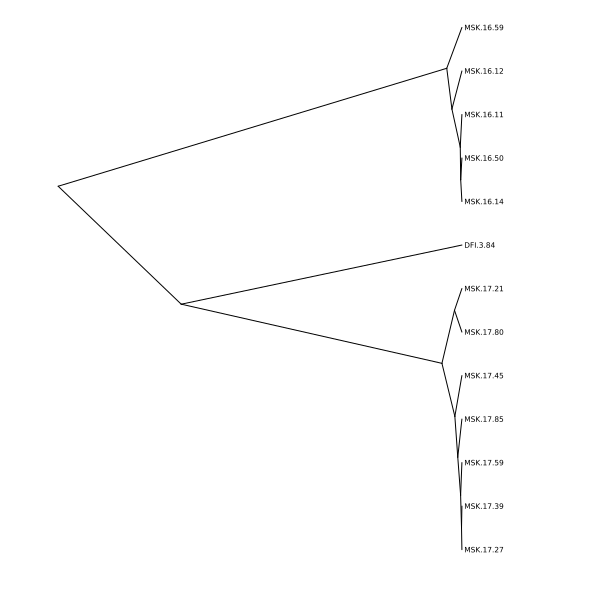

In [154]:
showsignodes = float.(permutedims((oldids .∈ Ref([233, 274]))))
# showsignodes = float.(permutedims((oldids .∈ Ref([304]))))
plot(subtree, 
    marker = true,
    # markersize=permutedims((oldids .∈ Ref([57, 71, 86, 136]))),
    markeralpha=showsignodes,
    internal=true,
    size=(600,600), 
    fs = 5, 
    sq=false,
    rightmargin=30Plots.Measures.mm
)